## Predicting Crime in Los Angeles
Capstone 1 Project - Step 2: Exploratory Data Analysis

Notebook by Oliver Bohler


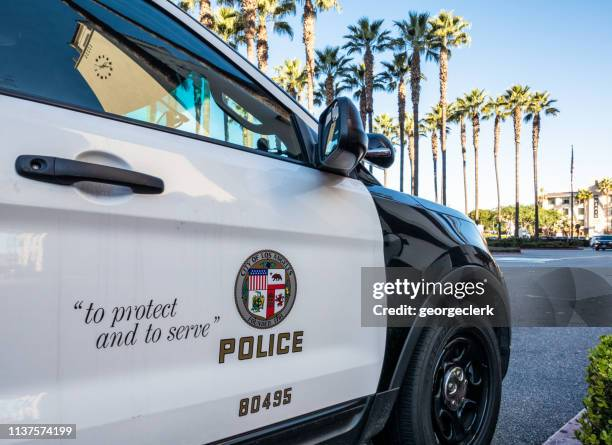

## The LAPD's major tech upgrade
When Mayor Karen Bass laid out her budget proposal for the Los Angeles Police Department last year, she had big plans for rebuilding the size of that agency’s workforce.

The mayor’s budget called for the LAPD to end the 2023-24 budget year with about 9,500 police officers — a target that would require the hiring of nearly 1,000 officers over a 12-month period.

Now, a new assessment from City Administrative Officer Matt Szabo — the city’s top budget analyst — shows the department is falling well short of its staffing goal. By June 30, the end of the fiscal year, the department is expected to have 8,908 officers, according to Szabo’s projections.

That would leave the LAPD with its lowest sworn staffing levels in over two decades.

The Los Angeles Police Department (LAPD) is gearing up to overhaul its old records with a brand new Records Management System (RMS) that will launch department-wide over the span of the year 2024.

The upgrade is part of a broader move to align with the Federal Bureau of Investigation's (FBI) National Incident-Based Reporting System (NIBRS) standards, which demands more granular and precise crime data reporting. "This cutting-edge RMS marks a crucial advancement, elevating our operational efficiency and data management practices." The RMS promises to save redundant information, amp up digitization, and offer increased centralized knowledge—meaning that officers and commanders can expect enhanced data access and improved abilities to investigate incidents.

Ahead of its launch, the LAPD is also highlighting the potential benefits of the RMS, including the ability for field interviews to be gathered via mobile devices, reducing the likelihood of reports being lost or misplaced, and providing primary officers with immediate access to gathered data. "Benefits of the new RMS available at launch," states the LAPD website, encompass a range of features aimed at both streamlining report completion and fostering robust investigations.

The NIBRS system, which has been the federal standard since January 2021, supports officer safety by providing quicker access to a fuller set of crime data and offers deeper insight into the context of crimes, profiles of victims and offenders, and a standardized framework for crime comparison across different jurisdictions.

It shows that there is a lot of change happening within the LAPD and the need for good data is bigger than ever. This project is using the data that was collected with the old system, hoping to show valuable insights for a new chapter of crime protection in the world of big data. 

## Import neccessary libraries and display settings

In [129]:
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Set Color Palette
GrayO = ["orange","black","gray", 'blue','red', 'green', 'purple', 'turquoise']
sns.set_palette(GrayO)

# Set Matplotlib display settings
%matplotlib inline
%config InlineBackend.figure_format='retina'
mpl.rcParams['figure.figsize'] = (16,8)

pd.options.display.max_columns = 400
pd.options.display.max_rows = 400

crimes = '/Users/oliverbohler/Desktop/Springboard/capstone project 2 violent crime in los angeles/Crime_LA_2010_2023.csv'
crime = pd.read_csv(crimes)
crime.head()

,Date Occured,Time Occured,Area Name,Zone,Crime Code,year,month,day,Weekday,Crime Code Description,Vict Age,Crime Category,Vict Sex,Vict Descent,Premis Code,Premis Group,Premis Desc,Weapon Category,Weapon Used Cd,Weapon Desc,Status,Status Desc,Location,Lat,Lon
0,2010-01-02,21:00,Central,Hollywood/Greater Downtown Area,122,2010,1,2,Saturday,"RAPE, ATTEMPTED",47.0,Sexual Offenses,F,H,103.0,Street/Outdoor,ALLEY,Strong-Arm,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,8TH ST,34.0387,-118.2488
1,2010-01-08,21:00,Central,Hollywood/Greater Downtown Area,230,2010,1,8,Friday,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",51.0,Assault & Battery,M,B,710.0,Other Premise,OTHER PREMISE,Other Object,500,UNKNOWN WEAPON/OTHER WEAPON,AA,Adult Arrest,500 CROCKER ST,34.0435,-118.2427
2,2010-01-09,02:30,Central,Hollywood/Greater Downtown Area,230,2010,1,9,Saturday,"ASSAULT WITH DEADLY WEAPON, AGGRAVATED ASSAULT",30.0,Assault & Battery,M,H,108.0,Street/Outdoor,PARKING LOT,Strong-Arm,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,800 W OLYMPIC BL,34.0450,-118.2640
3,2010-01-14,14:45,Central,Hollywood/Greater Downtown Area,624,2010,1,14,Thursday,BATTERY - SIMPLE ASSAULT,38.0,Assault & Battery,F,B,101.0,Street/Outdoor,STREET,Strong-Arm,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",IC,Invest Cont,900 N BROADWAY,34.0640,-118.2375
4,2010-01-14,20:00,Central,Hollywood/Greater Downtown Area,210,2010,1,14,Thursday,ROBBERY,40.0,Robbery & Burglary,M,H,101.0,Street/Outdoor,STREET,Strong-Arm,400,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",AO,Adult Other,ALAMEDA ST,34.0350,-118.2386


In [130]:
#Data Frames for analysis
crime_count = crime.groupby(['year', 'Zone']).size().reset_index(name='count')
crime_count_pivot = crime_count.pivot(index='year', columns ='Zone', values='count').fillna(0)
crime['Time Occured'] = pd.to_datetime(crime['Time Occured'])
code_counts = crime.groupby(['year','Zone','Crime Code', 'Crime Code Description']).size().reset_index(name='Count')

arrest_counts = crime.groupby(['Zone', 'year', 'Crime Code', 'Status', 'Status Desc']).size().reset_index(name='Count')
# Create a dictionary mapping crime codes to their descriptions
crime_code_desc = crime[['Crime Code', 'Crime Code Description']].drop_duplicates().set_index('Crime Code')['Crime Code Description'].to_dict()

/var/folders/0z/41_yxdy57v5gqbv0vhg6ky780000gn/T/ipykernel_53287/3228028980.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  crime['Time Occured'] = pd.to_datetime(crime['Time Occured'])


## The LAPD's jurisdiction 
In 2019, the Los Angeles Police Department (LAPD) had a jurisdiction of 503 square miles and a population of 3,979,576. The LAPD is one of the largest police forces in Los Angeles County, along with the Los Angeles Sheriff's Department (LASD). Together, the two departments patrol 91% of the county's land and serve almost 70% of the county's population. 
Because this is such a large area, we have to keep in mind that some grouped areas are more densly populated than others or are larger in size. The interactive map below shows the the jurisdiction highlighted in blue and the Zone. 

In [131]:
from IPython.display import IFrame

html_file_path = 'map_with_zones.html'

IFrame(html_file_path, width=800, height=600)

## Crime trend over the past 13 years
The first step here is to get a general idea for the trend in crimes within the city. Is crime in general on the rise? How has it behaved over the years? Below I will plot the crimes we filtered in the previous Data wrangling step and analyze the results.

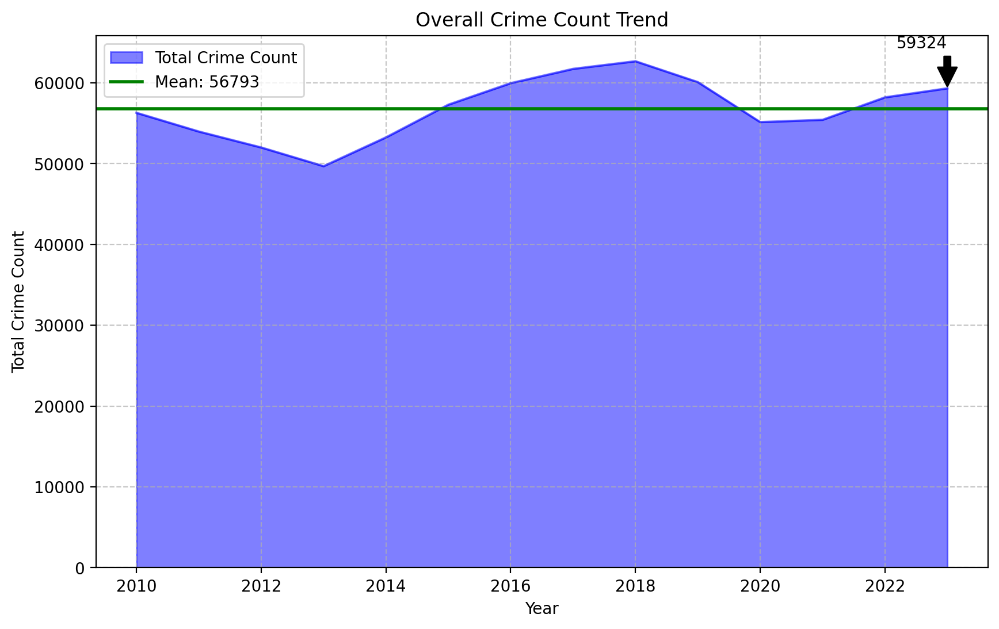

In [132]:
def endpoint_annotation(ax, overall_trend, offset=5000):
    """
    Adds an arrow annotation to highlight the final crime count on the plot.
    """
    final_year = overall_trend.index[-1]
    final_count = overall_trend.iloc[-1]
    
    ax.annotate(
        f'{final_count:.0f}',
        xy=(final_year, final_count),
        xytext=(final_year, final_count + offset), 
        arrowprops=dict(facecolor='black', shrink=0.05),
        horizontalalignment='right'
    )

overall_trend = crime_count.groupby('year')['count'].sum()
median = overall_trend.median()
mean = overall_trend.mean()

fig, ax = plt.subplots(figsize=(10,6))

overall_trend.plot(kind='area', alpha =0.5, color='b', label='Total Crime Count', ax=ax) 
ax.axhline(y=mean, color='g', linestyle='-', linewidth=2, label=f'Mean: {mean:.0f}')
# Add gridlines
ax.grid(True, linestyle='--', alpha=0.7)

ax.legend()
endpoint_annotation(ax, overall_trend, offset=5000)
ax.set_title('Overall Crime Count Trend')
ax.set_xlabel('Year')
ax.set_ylabel('Total Crime Count')
plt.show()

The graph shows that the average yearly amount of crimes committed is 56793. We can also see that there is a trend up for crime, with 2023 ending over the mean with 59324 reported crimes. We have to keep in mind that the drop in crime between 2020 and 2021 was most likely caused by the Covid-19 pandemic. To sum this up, it looks like crime is about to be back to a level not seen in over 4 years.

## Crime per Zone
Now that we have a better understanding of each Zone, let's graph the general crime rates for each of these Zones. Next, the focus will lay on the total amount of crimes committed for each of the following categories:

Assault & Battery, Robery & Burglary, Theft, Sexual Offenses and Vandalsim (incl. Aarson).

Lastly, the various crimes that fall under each category, will be graphed for each Zone. 

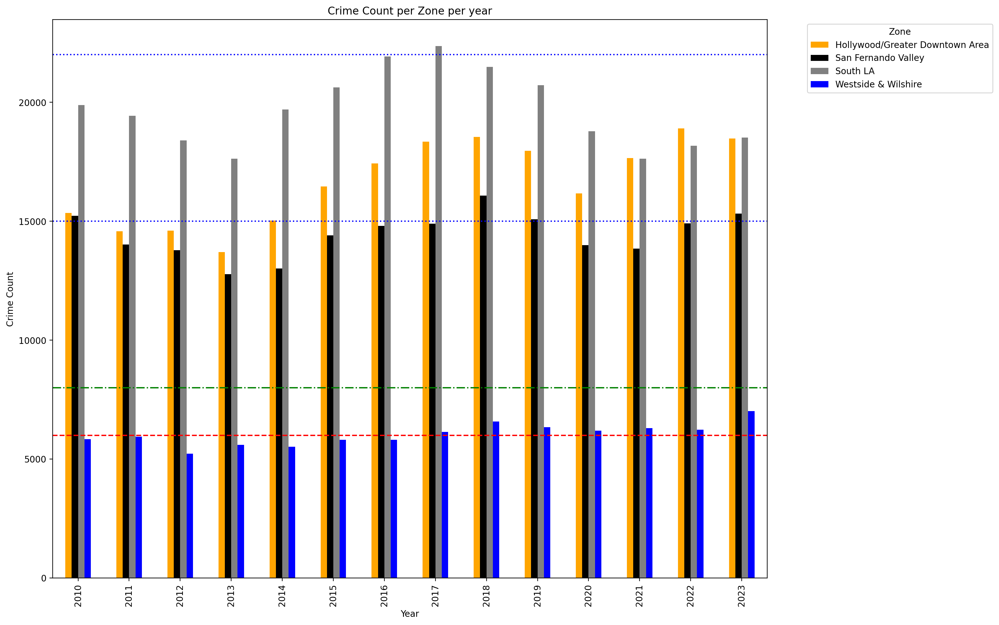

In [133]:
ax = crime_count_pivot.plot(kind='bar', figsize=(16,10))
plt.title('Crime Count per Zone per year')
plt.xlabel('Year')
plt.ylabel('Crime Count')
plt.legend(title='Zone', bbox_to_anchor=(1.05, 1), loc='upper left')

# Add horizontal marker lines
plt.axhline(y=6000, color='r', linestyle='--', label='Marker at 6000')
plt.axhline(y=8000, color='g', linestyle='-.', label='Marker at 8000')
plt.axhline(y=15000, color='b', linestyle=':', label='Marker at 15000')
plt.axhline(y=22000, color='b', linestyle=':', label='Marker at 22000')
plt.tight_layout()
plt.show()

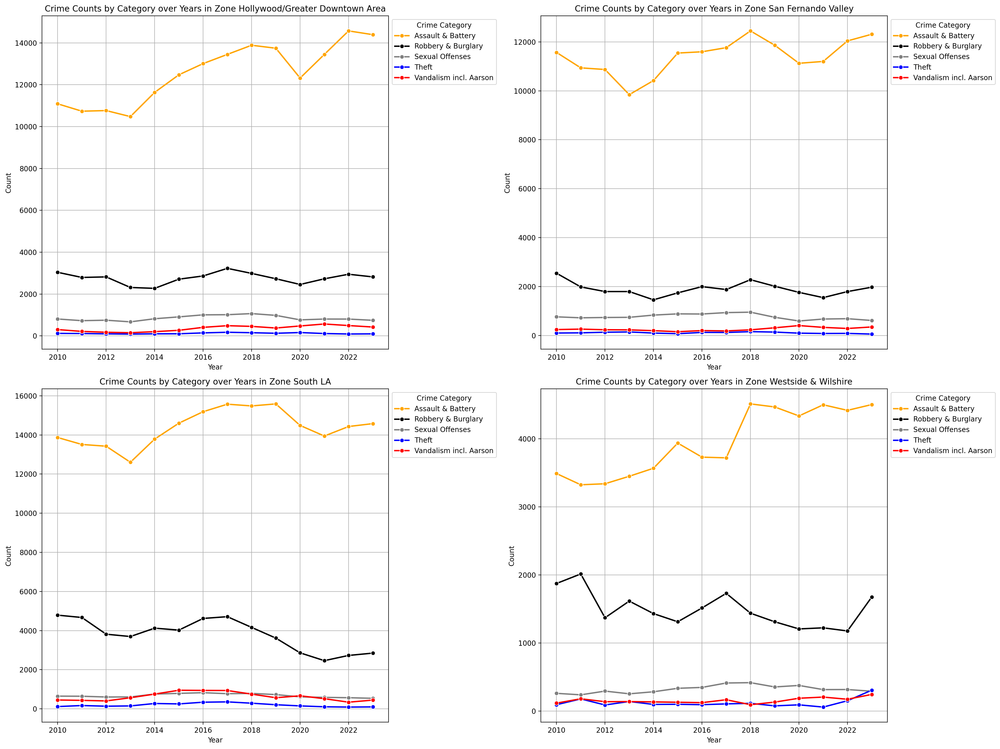

In [134]:
crime_counts = crime.groupby(['Zone', 'year', 'Crime Category']).size().unstack(fill_value=0)
crime_counts = crime_counts.reset_index()

unique_zones = crime_counts['Zone'].unique()

fig, axes = plt.subplots(2, 2, figsize=(20, 15)) 
axes = axes.flatten()

# Plot each zone separately
for i, zone in enumerate(unique_zones):
    ax = axes[i]
    zone_data = crime_counts[crime_counts['Zone'] == zone].set_index('year')

    # Plot each crime category over the years
    for crime_category in zone_data.columns[1:]:
        sns.lineplot(data=zone_data, x=zone_data.index, y=crime_category, 
                     marker='o', linewidth=2, label=crime_category, ax=ax)
    
    ax.set_title(f'Crime Counts by Category over Years in Zone {zone}')
    ax.set_xlabel('Year')
    ax.set_ylabel('Count')
    ax.legend(title='Crime Category', bbox_to_anchor=(1, 1), loc='upper left')
    ax.grid(True)

plt.tight_layout()
plt.show()

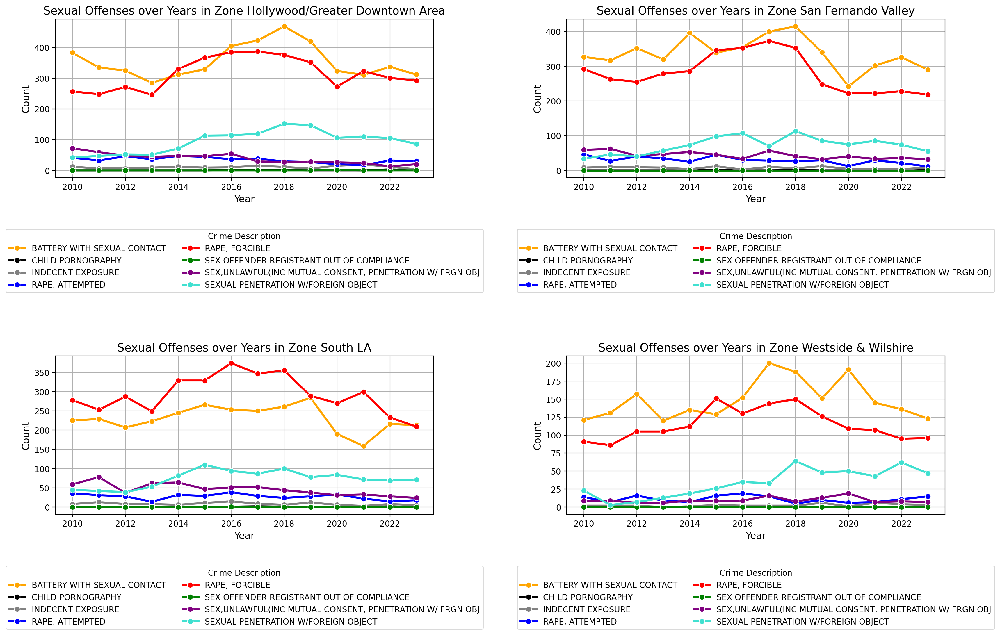

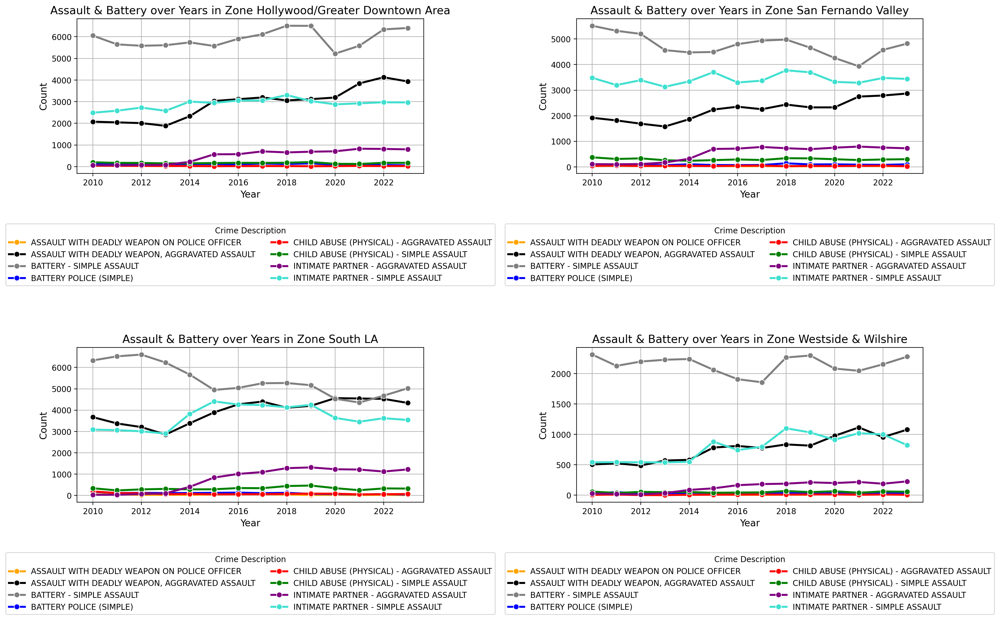

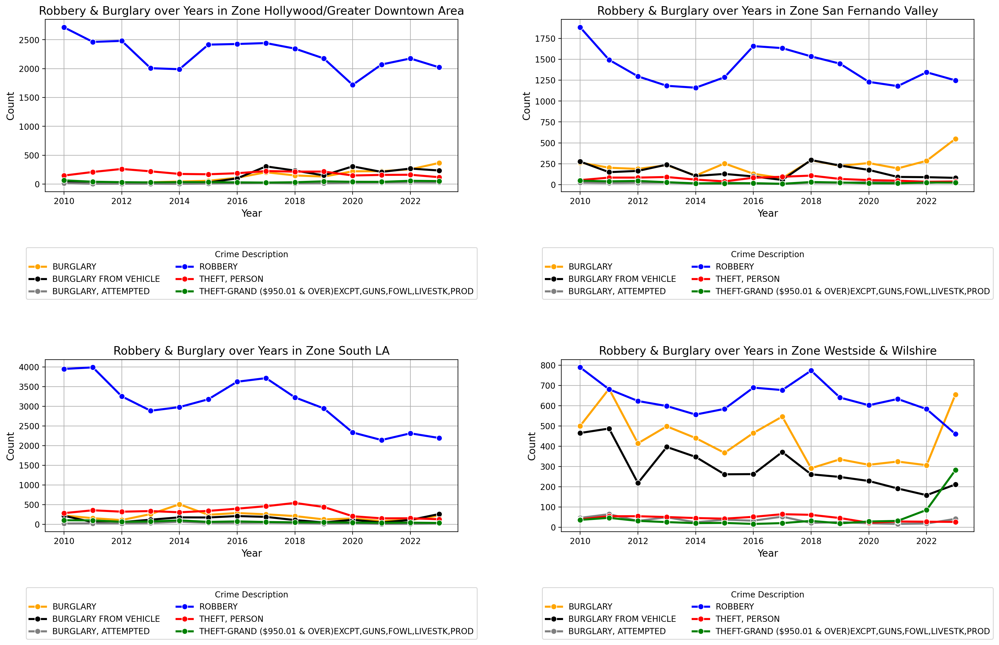

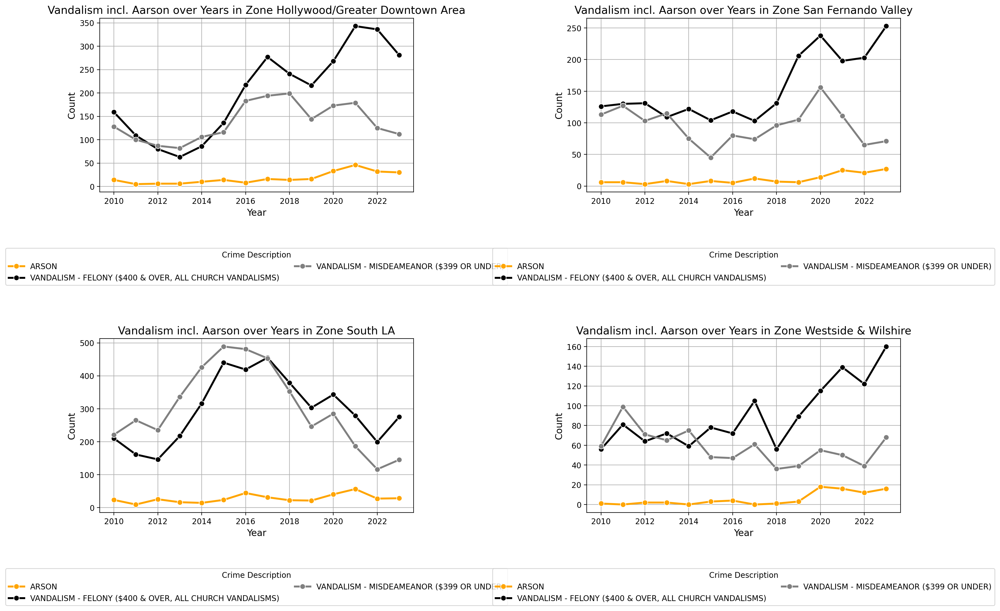

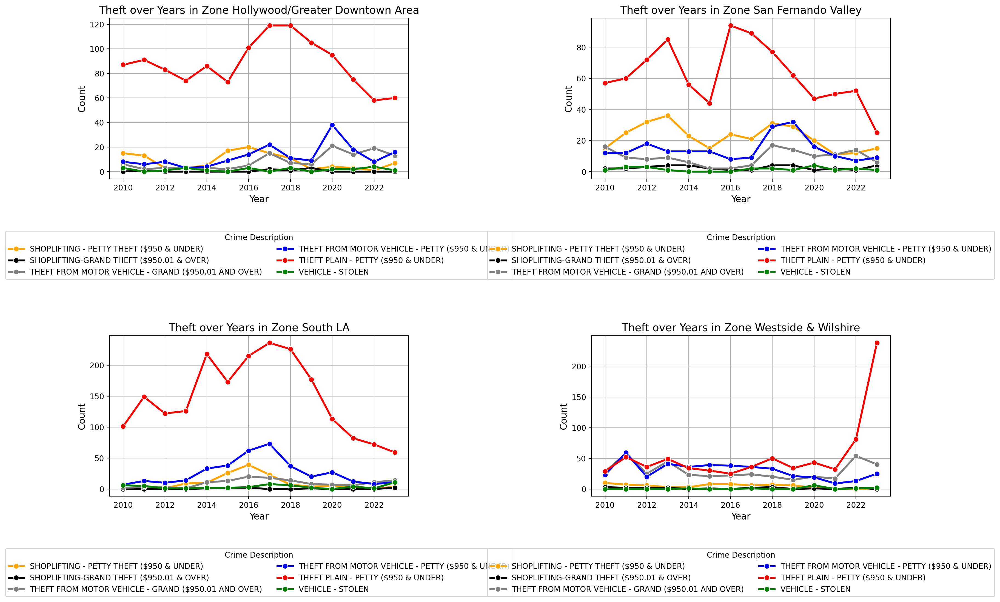

In [135]:
unique_categories = crime['Crime Category'].unique()

# Loop through each category and plot
for selected_category in unique_categories:
    filtered_crime = crime[crime['Crime Category'] == selected_category]
    crime_counts = filtered_crime.groupby(['Zone', 'year', 'Crime Code Description']).size().unstack(fill_value=0)
    crime_counts = crime_counts.reset_index()
    unique_zones = crime_counts['Zone'].unique()

    fig, axes = plt.subplots(2, 2, figsize=(18, 12))  # Adjust the figure size for readability
    axes = axes.flatten()

    # Plot each zone separately
    for i, zone in enumerate(unique_zones):
        if i >= len(axes):
            break
        ax = axes[i]
        zone_data = crime_counts[crime_counts['Zone'] == zone].set_index('year')

        # Plot each crime description over the years with adjusted line width and marker size
        for crime_description in zone_data.columns[1:]:
            sns.lineplot(data=zone_data, x=zone_data.index, y=crime_description, 
                         marker='o', linewidth=2.5, markersize=7, label=crime_description, ax=ax)
        
        ax.set_title(f'{selected_category} over Years in Zone {zone}', fontsize=14)
        ax.set_xlabel('Year', fontsize=12)
        ax.set_ylabel('Count', fontsize=12)
        
        # Position the legend below the plot
        ax.legend(title='Crime Description', bbox_to_anchor=(0.5, -0.3), loc='upper center', ncol=2, fontsize=10)
        ax.grid(True)

        # Adjust ticks and labels for readability
        ax.tick_params(axis='both', which='major', labelsize=10)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout(pad=3.0)  # Increase padding for clarity
    plt.show()

## The use of weapons
A huge security risk for officers is the use of guns, knifes or other weapons. Just as before with our crimes, I created subgroups for Guns, Kifes, Strong-Arm and other objects. If desired, this can be broken down further.

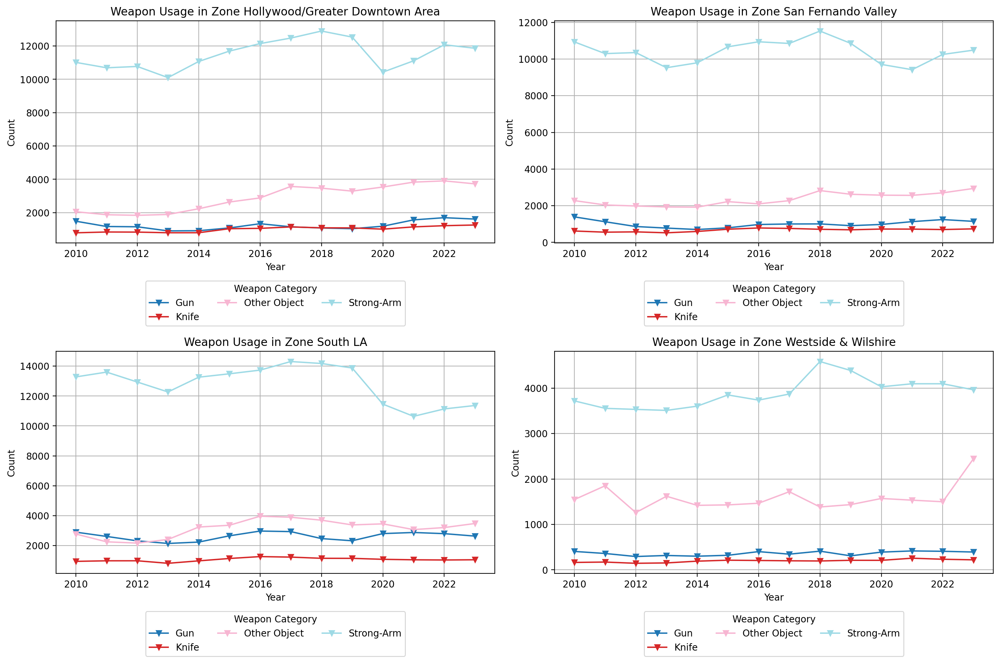

In [136]:
weapon_counts = crime.groupby(['Zone', 'year', 'Weapon Category']).size().reset_index(name='count')
weapon_counts_pivot = weapon_counts.pivot_table(index=['Zone', 'year'], columns=['Weapon Category'], values='count', aggfunc='sum', fill_value=0)

unique_zones = weapon_counts['Zone'].unique()

# Set up a 2x2 grid for the subplots
num_rows, num_cols = 2, 2

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))  # Adjusted size for 2x2 layout
axes = axes.flatten()

# Plot each zone separately
for i, zone in enumerate(unique_zones):
    if i >= len(axes):
        break
    ax = axes[i]
    
    zone_data = weapon_counts_pivot.loc[zone]
    
    # Plot each weapon category over the years
    zone_data.plot(kind='line', marker='v', ax=ax, cmap='tab20')
    
    ax.set_title(f'Weapon Usage in Zone {zone}')
    ax.set_xlabel('Year')
    ax.set_ylabel('Count')
    ax.legend(title='Weapon Category', bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=3)
    ax.grid(True)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

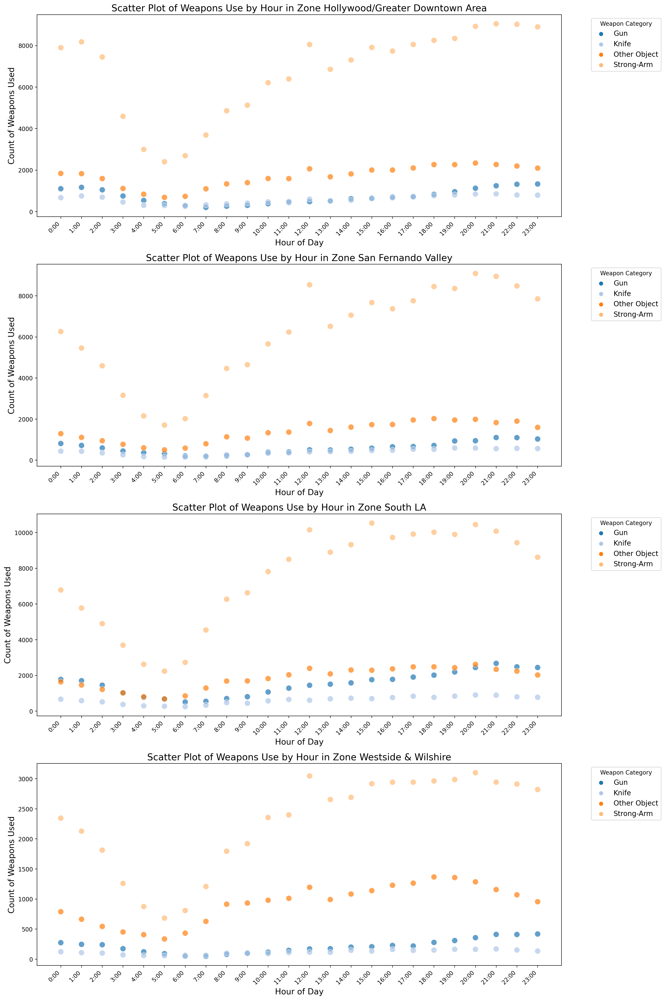

In [137]:
def weapon_scatter_by_zone(crime):
    crime['Time Occured'] = pd.to_datetime(crime['Time Occured'], errors='coerce')
    crime['Hour'] = crime['Time Occured'].dt.hour
    weapon_counts = crime.groupby(['Zone', 'Hour', 'Weapon Category']).size().reset_index(name='count')
    
    zones = sorted(crime['Zone'].unique())
    n_zones = len(zones)
    fig, axes = plt.subplots(n_zones, 1, figsize=(16, n_zones * 6), sharex=False)
    
    # Plot each zone
    for i, zone in enumerate(zones):
        zone_data = weapon_counts[weapon_counts['Zone'] == zone]
        sns.scatterplot(data=zone_data, x='Hour', y='count', hue='Weapon Category', ax=axes[i], alpha=0.7, s=100, palette='tab20')
        axes[i].set_title(f'Scatter Plot of Weapons Use by Hour in Zone {zone}', fontsize=16)
        axes[i].set_xlabel('Hour of Day', fontsize=14)
        axes[i].set_ylabel('Count of Weapons Used', fontsize=14)
        axes[i].set_xticks(range(0, 24))  # Set x-ticks to represent each hour
        axes[i].set_xticklabels([f'{h}:00' for h in range(24)], rotation=45, ha='right')
        axes[i].legend(title='Weapon Category', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    
    plt.tight_layout()
    plt.show()

weapon_scatter_by_zone(crime)

## When's the time for crime?
While it is normal to see some crimes drop and others rise, there are plenty o insights to be gained and can even be further analyzed. For this project, this look is deep enough for now. The timecrimes occur in each zone are being compared and visualied in the heatmap.

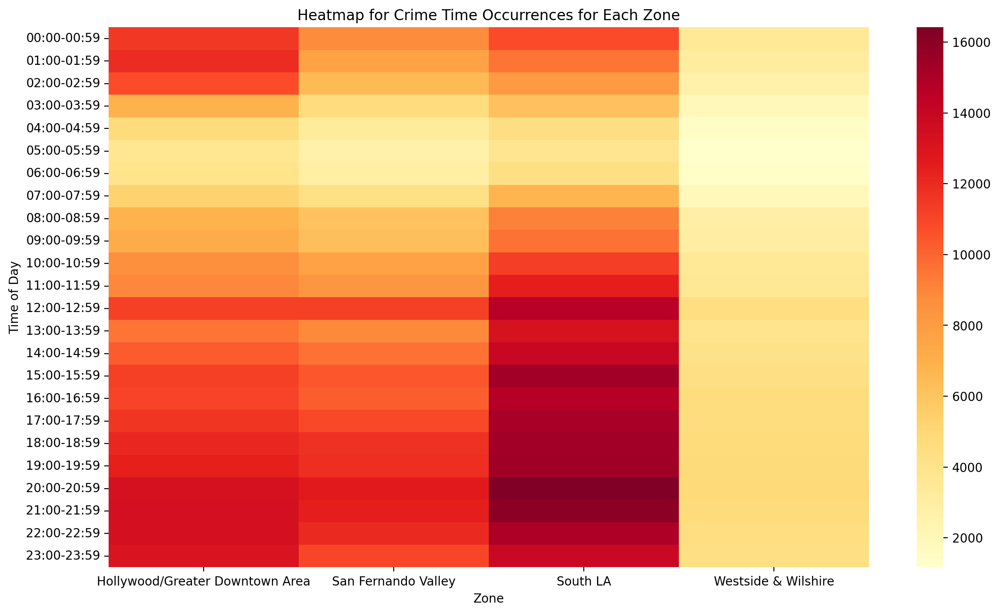

In [138]:
crime['Hour_Block'] = crime['Time Occured'].dt.hour
crime['Hour_Block'] = crime['Hour_Block'].astype(str).str.zfill(2) + ':00-' + crime['Hour_Block'].astype(str).str.zfill(2) + ':59'
crime_counts = crime.groupby(['Zone', 'Hour_Block']).size().reset_index(name='Count')
crime_pivot = crime_counts.pivot(index='Hour_Block', columns='Zone', values='Count').fillna(0)

plt.figure(figsize=(14, 8))
sns.heatmap(crime_pivot, cmap='YlOrRd', cbar=True)
plt.title('Heatmap for Crime Time Occurrences for Each Zone')
plt.xlabel('Zone')
plt.ylabel('Time of Day')
plt.show()

Since there are big differences for each zone, let's find out when and what day of the week we can expect more crimes to be committed.

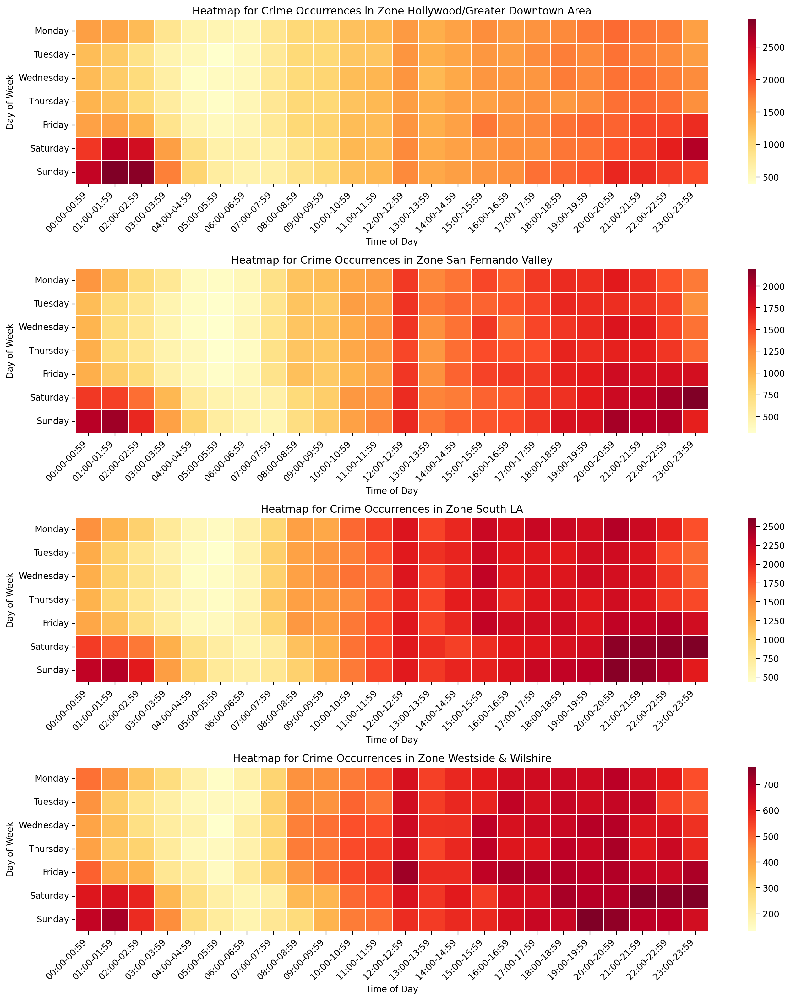

In [139]:
def crime_heatmap_by_zone(crime):
    crime['Hour_Block'] = crime['Time Occured'].dt.hour
    crime['Hour_Block'] = crime['Hour_Block'].astype(str).str.zfill(2) + ':00-' + crime['Hour_Block'].astype(str).str.zfill(2) + ':59'
    day_order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
    crime['Weekday']= pd.Categorical(crime['Weekday'], categories=day_order, ordered = True)

    weekday_counts = crime.groupby(['Zone', 'Weekday', 'Hour_Block']).size().reset_index(name='count')
    
    zones=sorted(crime['Zone'].unique())
    n_zones=len(zones)
    
    fig, axes= plt.subplots(n_zones, 1, figsize=(14, n_zones * 4), sharex=False)
    
    for i,zone in enumerate(zones):
        zone_data = weekday_counts[weekday_counts['Zone']==zone]
        weekday_pivot = zone_data.pivot_table(index='Weekday', columns='Hour_Block', values='count', fill_value=0)
        sns.heatmap(weekday_pivot,cmap='YlOrRd' ,cbar=True, linewidths=.5, ax=axes[i])
        axes[i].set_title(f'Heatmap for Crime Occurrences in Zone {zone}')
        axes[i].set_xlabel('Time of Day')
        axes[i].set_ylabel('Day of Week')
        axes[i].set_xticklabels(weekday_pivot.columns, rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
crime_heatmap_by_zone(crime)

An interesting fact is that there is barely any crime reported between 5am to 8am. This mght be due to many people starting their day and being at home. On the other hand it clearly. shows that weekends tend to have the most crimes committed.
Let's dive deeper and analyze when certain crimes happen.

## Plotting the time for crime

/var/folders/0z/41_yxdy57v5gqbv0vhg6ky780000gn/T/ipykernel_53287/3838541718.py:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(zone_data['Hour_Block'].unique(), rotation=45, ha='right')
/var/folders/0z/41_yxdy57v5gqbv0vhg6ky780000gn/T/ipykernel_53287/3838541718.py:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(zone_data['Hour_Block'].unique(), rotation=45, ha='right')
/var/folders/0z/41_yxdy57v5gqbv0vhg6ky780000gn/T/ipykernel_53287/3838541718.py:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(zone_data['Hour_Block'].unique(), rotation=45, ha='right')
/var/folders/0z/41_yxdy57v5gqbv0vhg6ky780000gn/T/ipykernel_53287/3838541718.py:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(zone_data['Hour_Block'].unique(), rotation=45, ha='right')


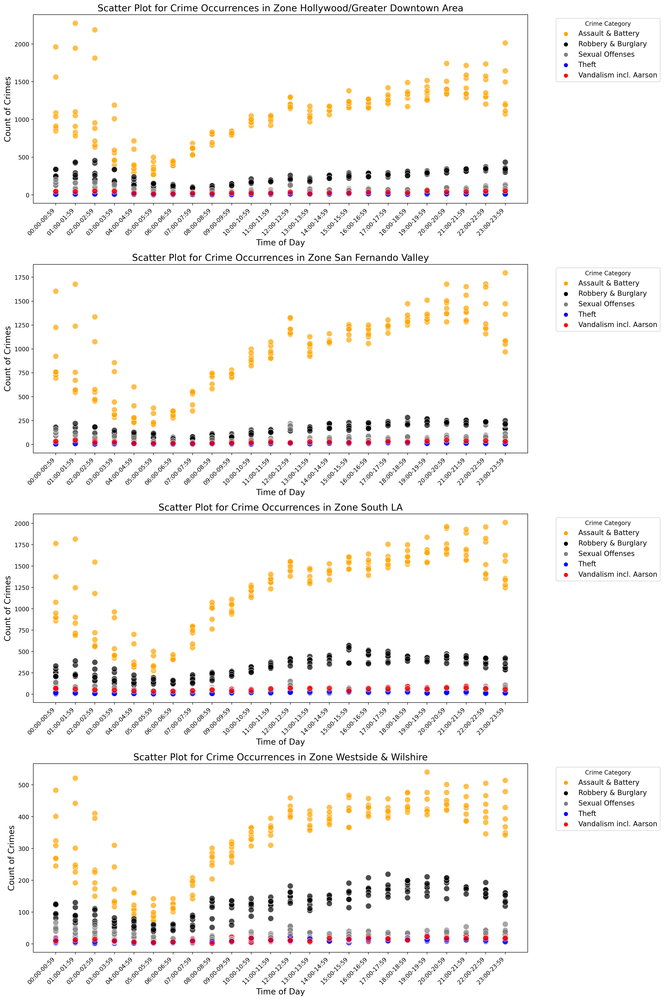

In [140]:
def crime_scatter_by_zone(crime):
    crime['Hour_Block'] = crime['Time Occured'].dt.hour
    crime['Hour_Block'] = crime['Hour_Block'].astype(str).str.zfill(2) + ':00-' + crime['Hour_Block'].astype(str).str.zfill(2) + ':59'
    day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    crime['Weekday'] = pd.Categorical(crime['Weekday'], categories=day_order, ordered=True)

    weekday_counts = crime.groupby(['Zone', 'Weekday', 'Hour_Block', 'Crime Category']).size().reset_index(name='count')
    zones = sorted(crime['Zone'].unique())
    n_zones = len(zones)
    
    fig, axes = plt.subplots(n_zones, 1, figsize=(16, n_zones * 6), sharex=False)  
    
    for i, zone in enumerate(zones):
        zone_data = weekday_counts[weekday_counts['Zone'] == zone]
        
        # Scatter plot for each zone
        sns.scatterplot(data=zone_data, x='Hour_Block', y='count', hue='Crime Category', ax=axes[i], alpha=0.7, s=100)  # Increased point size
        
        axes[i].set_title(f'Scatter Plot for Crime Occurrences in Zone {zone}', fontsize=16)
        axes[i].set_xlabel('Time of Day', fontsize=14)
        axes[i].set_ylabel('Count of Crimes', fontsize=14)
        axes[i].set_xticklabels(zone_data['Hour_Block'].unique(), rotation=45, ha='right')
        axes[i].legend(title='Crime Category', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    
    plt.tight_layout()
    plt.show()

crime_scatter_by_zone(crime)

The analysis shows a clear indication that crime goes up the later the day. Further analysis options here that are not considered for this project can be plotting the crimes for each category and analyzing the time for those crimes based on the zone.

## The Victims


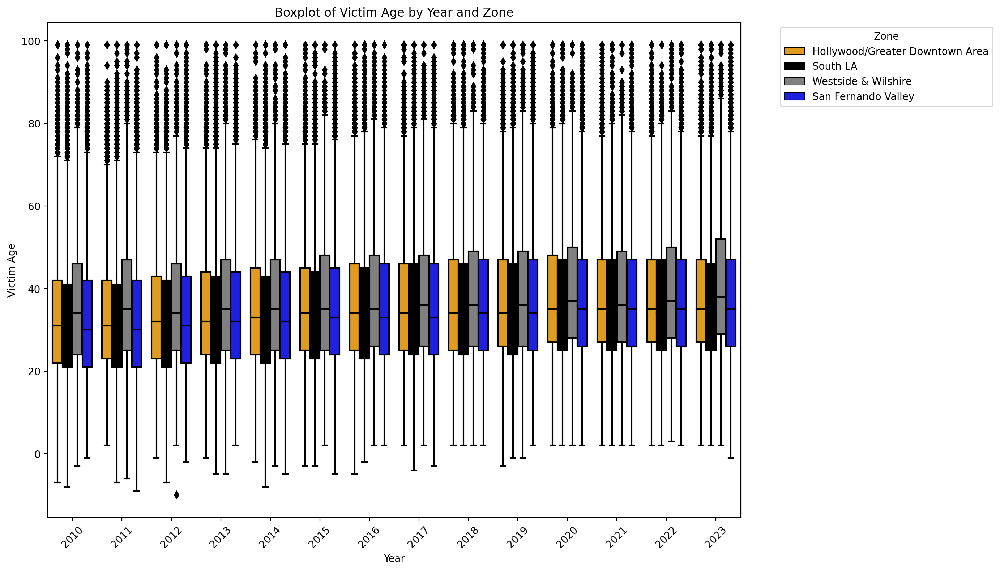

In [141]:
def plot_age_boxplot(crime):
    # Ensure 'Year' and 'Zone' are in the DataFrame
    if 'year' not in crime.columns or 'Zone' not in crime.columns:
        raise ValueError("DataFrame must contain 'Year' and 'Zone' columns.")
    
    # Plotting
    plt.figure(figsize=(14, 8))
    sns.boxplot(data=crime, x='year', y='Vict Age', hue='Zone', showfliers=True)
    
    plt.title('Boxplot of Victim Age by Year and Zone')
    plt.xlabel('Year')
    plt.ylabel('Victim Age')
    plt.xticks(rotation=45)  # Rotate x-axis labels if needed
    plt.legend(title='Zone', bbox_to_anchor=(1.05, 1), loc='upper left')
    
    plt.tight_layout()
    plt.show()

# Call the function with your crime DataFrame
plot_age_boxplot(crime)

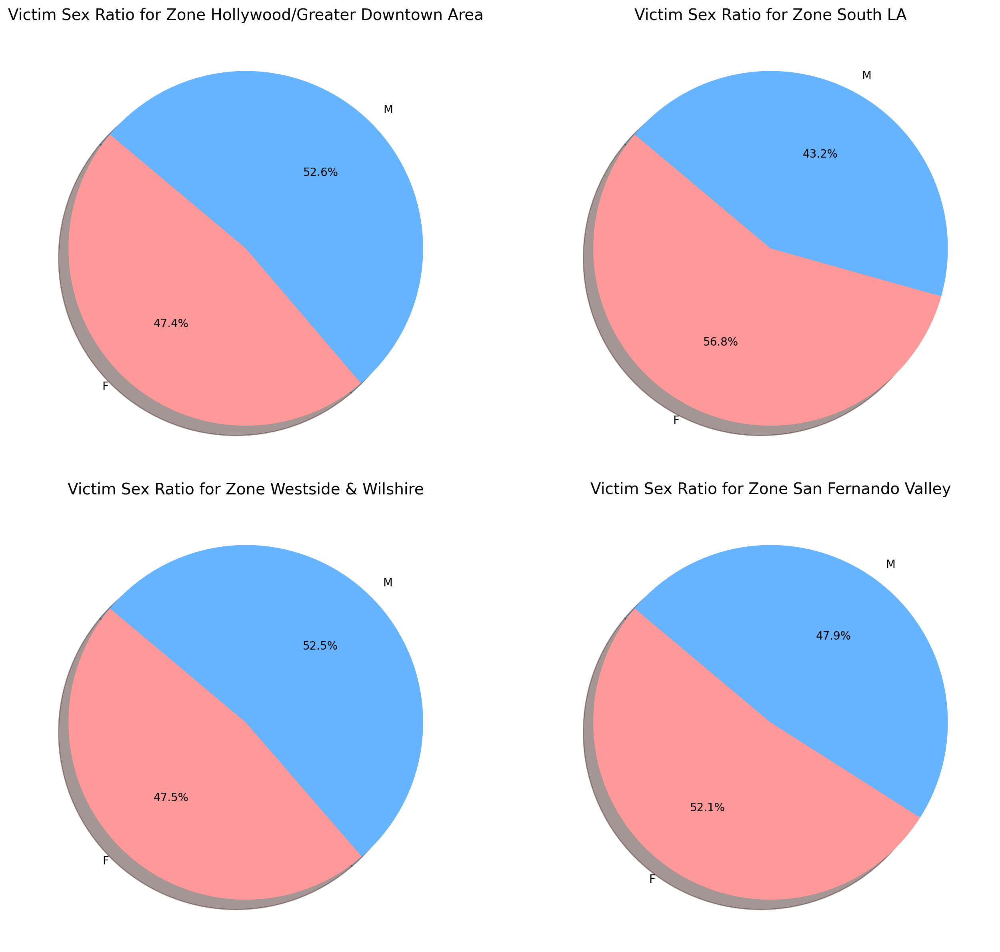

In [142]:
def plot_pie_charts_by_zone(crime):
    # Group by Zone and Vict Sex and count occurrences
    sex_counts = crime.groupby(['Zone', 'Vict Sex']).size().reset_index(name='Count')

    # Get unique zones
    zones = crime['Zone'].unique()
    num_zones = len(zones)
    
    # Create a 2x2 grid for the pie charts
    fig, axes = plt.subplots(2, 2, figsize=(14, 12), subplot_kw=dict(aspect='equal'))
    
    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    
    for i, zone in enumerate(zones):
        ax = axes[i]
        
        # Filter data for the current zone
        zone_sex_counts = sex_counts[sex_counts['Zone'] == zone]
        
        # Pie chart data preparation
        sex_labels = zone_sex_counts['Vict Sex']
        sex_sizes = zone_sex_counts['Count']
        
        # Plot pie chart for Vict Sex
        ax.pie(sex_sizes, labels=sex_labels, autopct='%1.1f%%', colors=['#ff9999', '#66b3ff'], startangle=140, shadow=True)
        
        ax.set_title(f'Victim Sex Ratio for Zone {zone}', fontsize=14)
    
    plt.tight_layout()
    plt.show()

# Call the function with your crime DataFrame
plot_pie_charts_by_zone(crime)

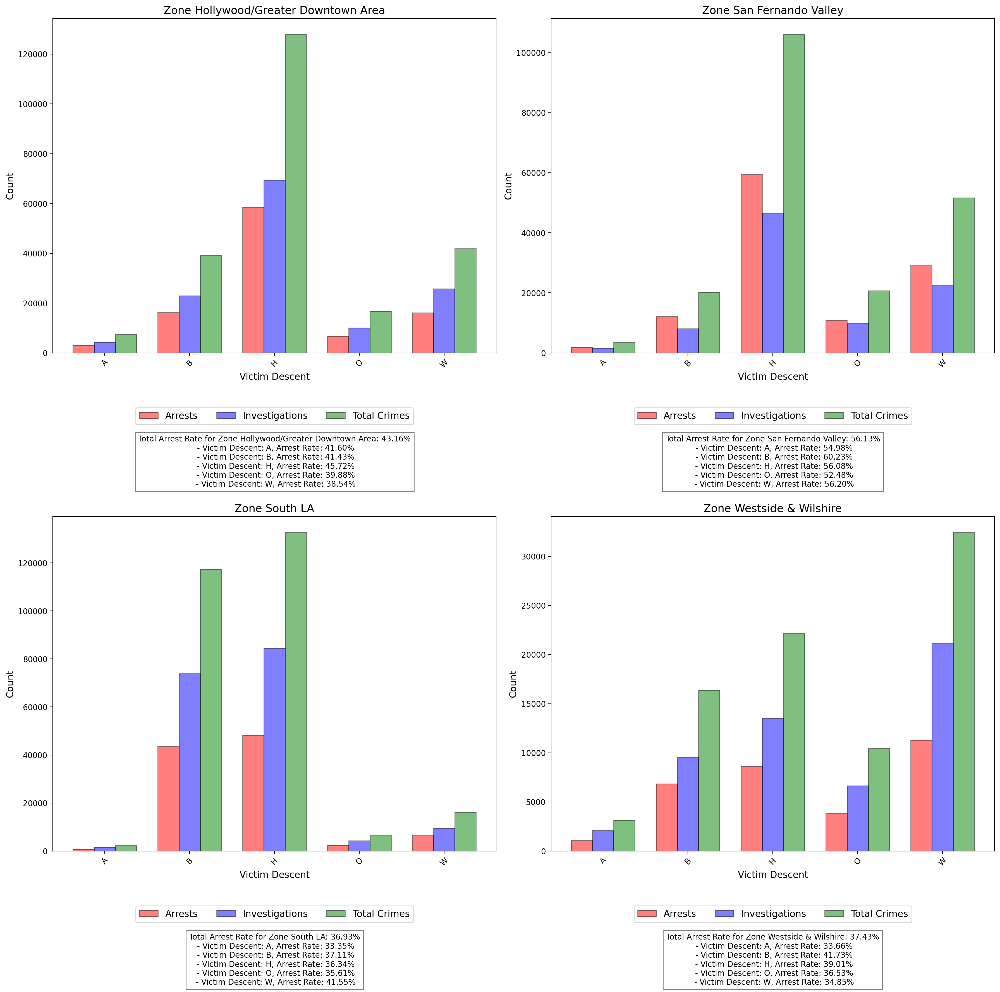

In [143]:
def zones_arrest_rate_by_race(crime):
    arrest_data = crime[crime['Status'].isin(['AA', 'AO', 'JA', 'JO'])]
    arrest_counts = arrest_data.groupby(['Zone', 'Vict Descent']).size().reset_index(name='Arrests')
    
    investigation_data = crime[crime['Status'] == 'IC']
    investigation_counts = investigation_data.groupby(['Zone', 'Vict Descent']).size().reset_index(name='Investigations')

    # Merge arrest and investigation counts
    merged_data = pd.merge(arrest_counts, investigation_counts, on=['Zone', 'Vict Descent'], how='outer').fillna(0)
    # Add total crimes column
    merged_data['Total Crimes'] = merged_data['Arrests'] + merged_data['Investigations']
    
    zones = merged_data['Zone'].unique()
    n_zones = len(zones)

    # Create a grid for the plots
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18, 18))  # Adjust grid size as needed
    axes = axes.flatten()
    
    bar_width = 0.25
    offset = bar_width  # Offset for overlapping bars

    for i, zone in enumerate(zones):
        zone_data = merged_data[merged_data['Zone'] == zone]
        
        ax = axes[i]

        x_positions = np.arange(len(zone_data['Vict Descent']))
        
        # Plot bar chart for counts by victim descent and zone with customized colors and edge colors
        ax.bar(x_positions - offset, zone_data['Arrests'], color='red', edgecolor='black', alpha=0.5, width=bar_width, label='Arrests')
        ax.bar(x_positions, zone_data['Investigations'], color='blue', edgecolor='black', alpha=0.5, width=bar_width, label='Investigations')
        ax.bar(x_positions + offset, zone_data['Total Crimes'], color='green', edgecolor='black', alpha=0.5, width=bar_width, label='Total Crimes')
        
        ax.set_title(f'Zone {zone}', fontsize=14)
        ax.set_xlabel('Victim Descent', fontsize=12)
        ax.set_ylabel('Count', fontsize=12)
        ax.set_xticks(x_positions)
        ax.set_xticklabels(zone_data['Vict Descent'], rotation=45)
        
        # Adjust legend to be below the plot
        ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3, fontsize=12)
        
        # Calculate and format arrest rates for display
        total_arrests = zone_data['Arrests'].sum()
        total_investigations = zone_data['Investigations'].sum()
        total_crimes = total_arrests + total_investigations
        arrest_rate = total_arrests / total_crimes if total_crimes > 0 else 0

        arrest_rate_text = f"Total Arrest Rate for Zone {zone}: {arrest_rate:.2%}\n"
        arrest_rate_text += "\n".join(
            [f" - Victim Descent: {row['Vict Descent']}, Arrest Rate: "
             f"{(row['Arrests'] / (row['Arrests'] + row['Investigations'])):.2%}" 
             if (row['Arrests'] + row['Investigations']) > 0 else " - Arrest Rate: N/A"
             for idx, row in zone_data.iterrows()]
        )

        # Annotate arrest rate below the plot
        ax.annotate(arrest_rate_text, xy=(0.5, -0.4), xycoords='axes fraction', ha='center', fontsize=10, color='black', 
                    bbox=dict(facecolor='white', alpha=0.5))
        
    plt.tight_layout()
    plt.show()

zones_arrest_rate_by_race(crime)


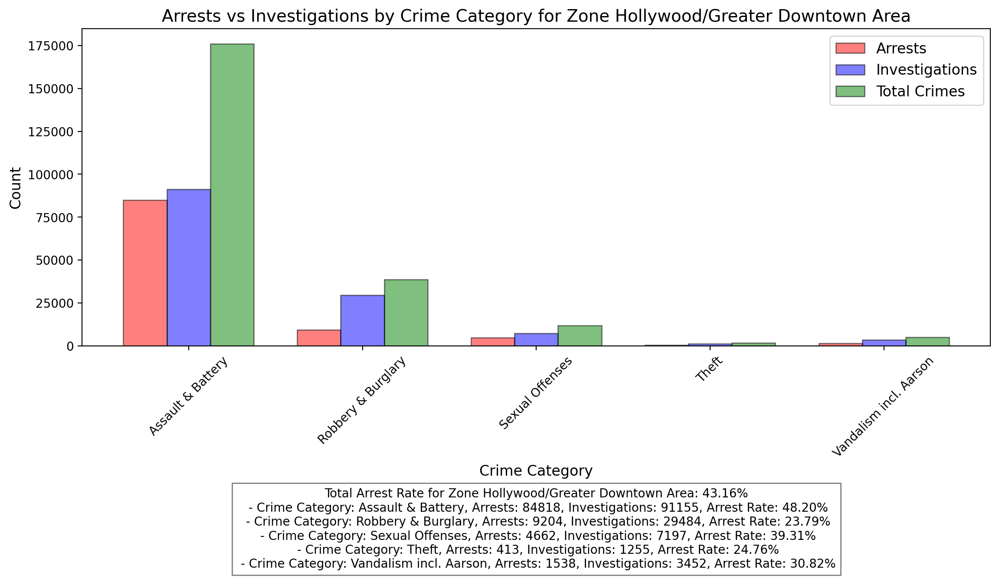

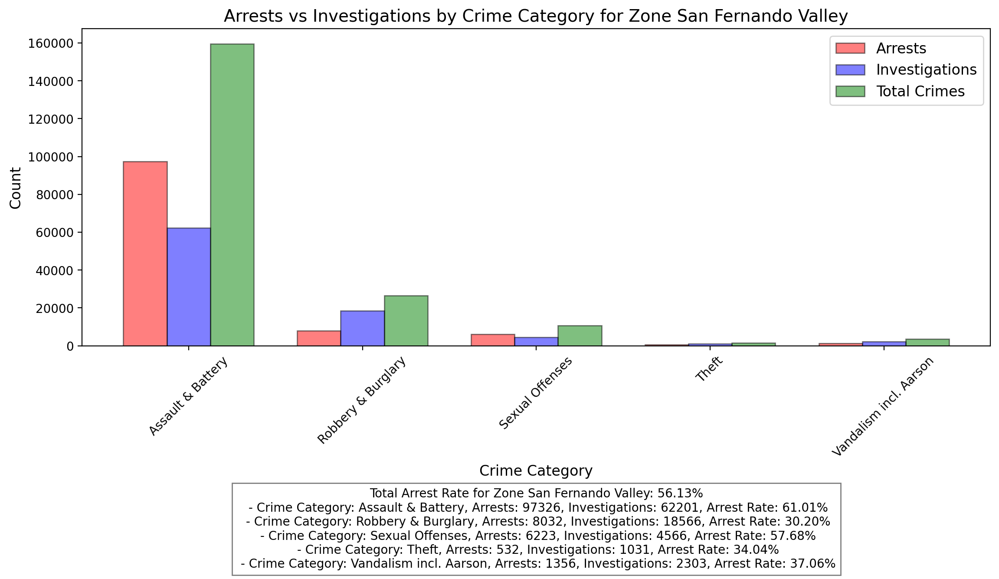

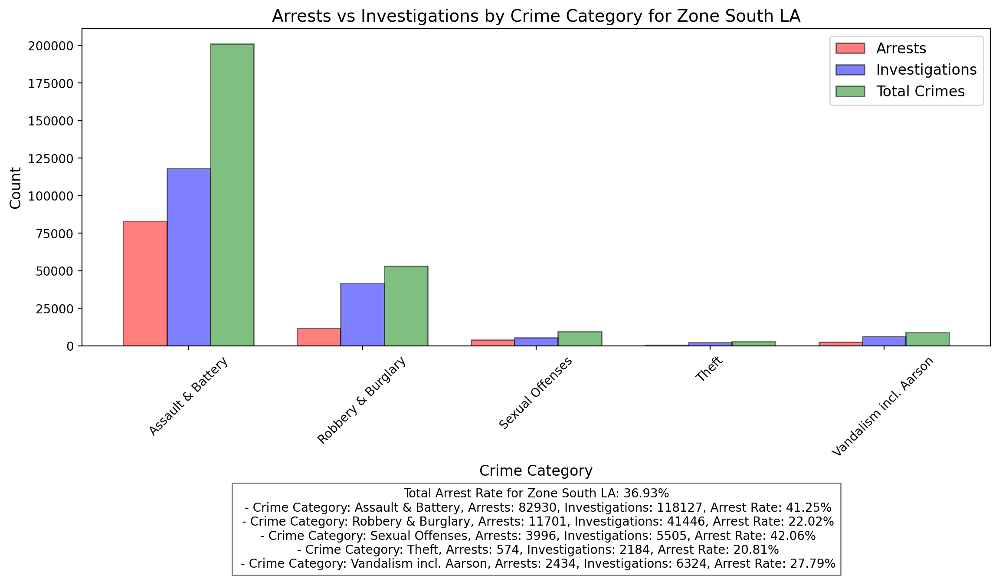

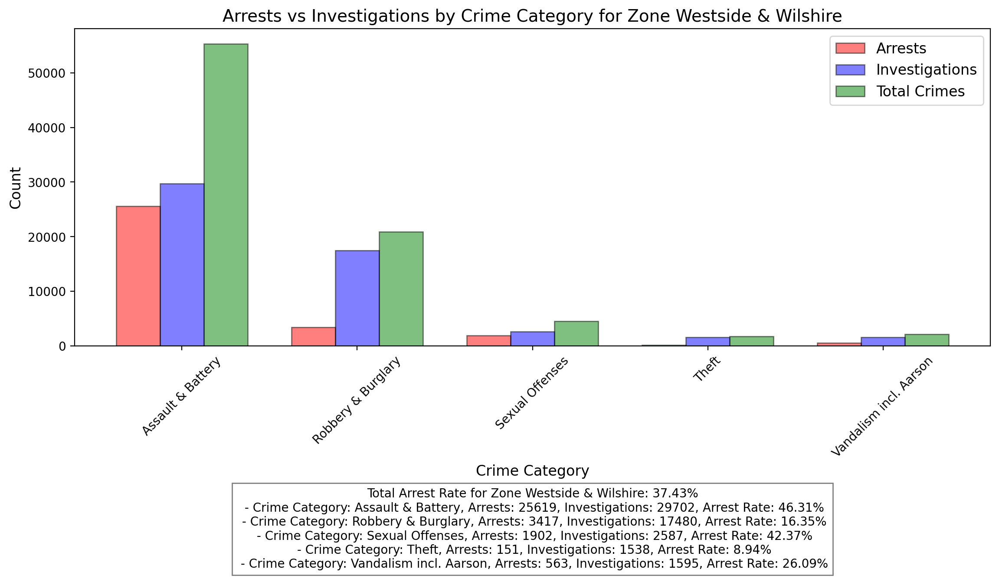

In [144]:
def zones_arrest_rate_by_category(crime):
    # Filter data for arrests and investigations
    arrest_data = crime[crime['Status'].isin(['AA', 'AO', 'JA', 'JO'])]
    arrest_counts = arrest_data.groupby(['Zone', 'Crime Category']).size().reset_index(name='Arrests')
    
    investigation_data = crime[crime['Status'] == 'IC']
    investigation_counts = investigation_data.groupby(['Zone', 'Crime Category']).size().reset_index(name='Investigations')

    # Merge data to get counts for each zone and crime
    merged_data = pd.merge(arrest_counts, investigation_counts, on=['Zone', 'Crime Category'], how='outer').fillna(0)
    
    # Calculate total crimes and arrest rate
    merged_data['Total Crimes'] = merged_data['Arrests'] + merged_data['Investigations']
    merged_data['Arrest Rate'] = merged_data['Arrests'] / merged_data['Total Crimes']
    
    zones = merged_data['Zone'].unique()
    
    for zone in zones:
        zone_data = merged_data[merged_data['Zone'] == zone]
        
        # Increase the figure height
        fig, ax = plt.subplots(figsize=(12, 10))
        
        bar_width = 0.25
        x_positions = np.arange(len(zone_data['Crime Category']))
        
        ax.bar(x_positions - bar_width, zone_data['Arrests'], color='red', edgecolor='black', alpha=0.5, width=bar_width, label='Arrests')
        ax.bar(x_positions, zone_data['Investigations'], color='blue', edgecolor='black', alpha=0.5, width=bar_width, label='Investigations')
        ax.bar(x_positions + bar_width, zone_data['Total Crimes'], color='green', edgecolor='black', alpha=0.5, width=bar_width, label='Total Crimes')
        
        ax.set_title(f'Arrests vs Investigations by Crime Category for Zone {zone}', fontsize=14)
        ax.set_xlabel('Crime Category', fontsize=12)
        ax.set_ylabel('Count', fontsize=12)
        ax.set_xticks(x_positions)
        ax.set_xticklabels(zone_data['Crime Category'], rotation=45)
        
        # Adjust legend to be in the top right corner of the plot
        ax.legend(loc='upper right', fontsize=12)
        
        # Calculate and format arrest rates for display
        total_arrests = zone_data['Arrests'].sum()
        total_investigations = zone_data['Investigations'].sum()
        total_crimes = total_arrests + total_investigations
        arrest_rate_text = f"Total Arrest Rate for Zone {zone}: {total_arrests / total_crimes:.2%}\n" if total_crimes > 0 else "Total Arrest Rate: N/A\n"
        
        arrest_rate_text += "\n".join(
            [f" - Crime Category: {row['Crime Category']}, Arrests: {row['Arrests']}, Investigations: {row['Investigations']}, Arrest Rate: "
             f"{(row['Arrests'] / (row['Arrests'] + row['Investigations'])):.2%}" 
             if (row['Arrests'] + row['Investigations']) > 0 else " - Arrest Rate: N/A"
             for idx, row in zone_data.iterrows()]
        )

        # Annotate arrest rate below the plot, moving it further down
        ax.annotate(arrest_rate_text, xy=(0.5, -0.7), xycoords='axes fraction', ha='center', fontsize=10, color='black', 
                    bbox=dict(facecolor='white', alpha=0.5))
        
        # Increase spacing between plots
        plt.tight_layout(pad=2.5)
        plt.show()

# Example usage with crime DataFrame
zones_arrest_rate_by_category(crime)